In [1]:
#importing Libraries
from sklearn.decomposition import PCA
import numpy as np
import pandas as pd
#import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Loading Dataset
dtf = pd.read_csv('E:\Python Programs\FoodData.csv')

FileNotFoundError: [Errno 2] No such file or directory: 'D:\\Python Programs\\FoodData.csv'

In [ ]:
dtf

,ID,FoodGroup,ShortDescrip,Descrip,CommonName,MfgName,ScientificName,Energy_kcal,Protein_g,Fat_g,...,Folate_USRDA,Niacin_USRDA,Riboflavin_USRDA,Thiamin_USRDA,Calcium_USRDA,Copper_USRDA,Magnesium_USRDA,Phosphorus_USRDA,Selenium_USRDA,Zinc_USRDA
0,1001,Dairy and Egg Products,"BUTTER,WITH SALT","Butter, salted",NaN,NaN,NaN,717,0.85,81.11,...,0.0075,0.002625,0.026154,0.004167,0.020000,0.000000,0.004762,0.034286,0.018182,0.008182
1,1002,Dairy and Egg Products,"BUTTER,WHIPPED,WITH SALT","Butter, whipped, with salt",NaN,NaN,NaN,717,0.85,81.11,...,0.0075,0.002625,0.026154,0.004167,0.020000,0.000018,0.004762,0.032857,0.018182,0.004545
2,1003,Dairy and Egg Products,"BUTTER OIL,ANHYDROUS","Butter oil, anhydrous",NaN,NaN,NaN,876,0.28,99.48,...,0.0000,0.000188,0.003846,0.000833,0.003333,0.000001,0.000000,0.004286,0.000000,0.000909
3,1004,Dairy and Egg Products,"CHEESE,BLUE","Cheese, blue",NaN,NaN,NaN,353,21.40,28.74,...,0.0900,0.063500,0.293846,0.024167,0.440000,0.000044,0.054762,0.552857,0.263636,0.241818
4,1005,Dairy and Egg Products,"CHEESE,BRICK","Cheese, brick",NaN,NaN,NaN,371,23.24,29.68,...,0.0500,0.007375,0.270000,0.011667,0.561667,0.000027,0.057143,0.644286,0.263636,0.236364
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8613,83110,Finfish and Shellfish Products,"MACKEREL,SALTED","Fish, mackerel, salted",NaN,NaN,NaN,305,18.50,25.10,...,0.0375,0.206250,0.146154,0.016667,0.055000,0.000111,0.142857,0.362857,1.334545,0.100000
8614,90240,Finfish and Shellfish Products,"SCALLOP,(BAY&SEA),CKD,STMD","Mollusks, scallop, (bay and sea), cooked, steamed",NaN,NaN,NaN,111,20.54,0.84,...,0.0500,0.067250,0.018462,0.010000,0.008333,0.000037,0.088095,0.608571,0.394545,0.140909
8615,90480,Sweets,"SYRUP,CANE","Syrup, Cane",NaN,NaN,NaN,269,0.00,0.00,...,0.0000,0.006250,0.046154,0.108333,0.010833,0.000022,0.023810,0.011429,0.012727,0.017273
8616,90560,Finfish and Shellfish Products,"SNAIL,RAW","Mollusks, snail, raw",NaN,NaN,NaN,90,16.10,1.40,...,0.0150,0.087500,0.092308,0.008333,0.008333,0.000444,0.595238,0.388571,0.498182,0.090909


In [ ]:
# Removing Columns that have Non Necessery Values
dtf_upd = dtf.drop(labels=["CommonName","MfgName","ScientificName","Descrip","ShortDescrip","ID"],axis=1)


In [ ]:
dtf_upd

,FoodGroup,Energy_kcal,Protein_g,Fat_g,Carb_g,Sugar_g,Fiber_g,VitA_mcg,VitB6_mg,VitB12_mcg,...,Folate_USRDA,Niacin_USRDA,Riboflavin_USRDA,Thiamin_USRDA,Calcium_USRDA,Copper_USRDA,Magnesium_USRDA,Phosphorus_USRDA,Selenium_USRDA,Zinc_USRDA
0,Dairy and Egg Products,717,0.85,81.11,0.06,0.06,0.0,684,0.003,0.17,...,0.0075,0.002625,0.026154,0.004167,0.020000,0.000000,0.004762,0.034286,0.018182,0.008182
1,Dairy and Egg Products,717,0.85,81.11,0.06,0.06,0.0,684,0.003,0.13,...,0.0075,0.002625,0.026154,0.004167,0.020000,0.000018,0.004762,0.032857,0.018182,0.004545
2,Dairy and Egg Products,876,0.28,99.48,0.00,0.00,0.0,840,0.001,0.01,...,0.0000,0.000188,0.003846,0.000833,0.003333,0.000001,0.000000,0.004286,0.000000,0.000909
3,Dairy and Egg Products,353,21.40,28.74,2.34,0.50,0.0,198,0.166,1.22,...,0.0900,0.063500,0.293846,0.024167,0.440000,0.000044,0.054762,0.552857,0.263636,0.241818
4,Dairy and Egg Products,371,23.24,29.68,2.79,0.51,0.0,292,0.065,1.26,...,0.0500,0.007375,0.270000,0.011667,0.561667,0.000027,0.057143,0.644286,0.263636,0.236364
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8613,Finfish and Shellfish Products,305,18.50,25.10,0.00,0.00,0.0,47,0.410,12.00,...,0.0375,0.206250,0.146154,0.016667,0.055000,0.000111,0.142857,0.362857,1.334545,0.100000
8614,Finfish and Shellfish Products,111,20.54,0.84,5.41,0.00,0.0,2,0.112,2.15,...,0.0500,0.067250,0.018462,0.010000,0.008333,0.000037,0.088095,0.608571,0.394545,0.140909
8615,Sweets,269,0.00,0.00,73.14,73.20,0.0,0,0.000,0.00,...,0.0000,0.006250,0.046154,0.108333,0.010833,0.000022,0.023810,0.011429,0.012727,0.017273
8616,Finfish and Shellfish Products,90,16.10,1.40,2.00,0.00,0.0,30,0.130,0.50,...,0.0150,0.087500,0.092308,0.008333,0.008333,0.000444,0.595238,0.388571,0.498182,0.090909


In [ ]:
# Deviding Dataset
x = dtf_upd.iloc[:,5:38]
y = dtf_upd.iloc[:,1:4]

In [ ]:
# PCA on Componet X
pca = PCA(n_components = 8)
pca.fit(x)
x_transformed = pca.transform(x)
print("Orignal Shape =",x.shape)
print("Reduced Shape = ",x_transformed.shape)
print("Details of Principle Components are",pca.components_.round(3))
print("Variance as per Components",pca.explained_variance_ratio_.round(3))

Orignal Shape = (8618, 33)
Reduced Shape =  (8618, 8)
Details of Principle Components are [[ 0.     0.     0.999  0.     0.003  0.008  0.     0.028  0.001  0.
   0.     0.011  0.     0.001  0.002  0.003  0.016  0.002  0.     0.001
   0.     0.001  0.     0.     0.     0.     0.     0.     0.     0.
   0.     0.     0.   ]
 [ 0.004  0.004 -0.025  0.001  0.001  0.017  0.002  0.22   0.005  0.001
   0.001  0.683  0.     0.009  0.1    0.002  0.689  0.015  0.004 -0.
   0.     0.     0.     0.     0.001  0.     0.     0.     0.001  0.
   0.     0.001  0.   ]
 [ 0.012  0.004 -0.023  0.001  0.002  0.016  0.003  0.972  0.012  0.001
   0.001 -0.122  0.     0.012  0.036 -0.    -0.196 -0.003  0.004 -0.
   0.001  0.001  0.     0.     0.002  0.001  0.001  0.001 -0.     0.
   0.    -0.    -0.   ]
 [ 0.019  0.002  0.005 -0.    -0.005  0.056  0.001 -0.047 -0.006 -0.
  -0.     0.718 -0.001  0.005 -0.063 -0.    -0.687 -0.051 -0.004  0.
  -0.    -0.002  0.001  0.    -0.    -0.    -0.    -0.     0.001 -0.
 

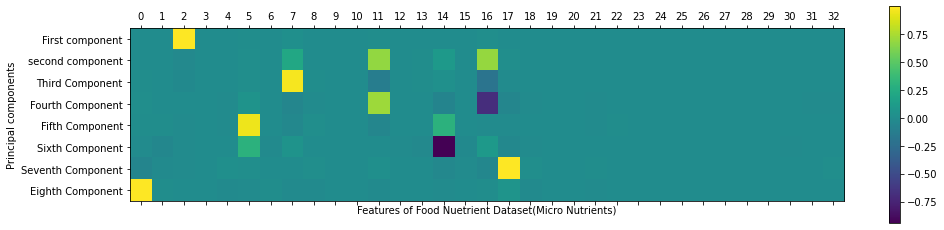

In [ ]:
# Plotting Heat Map of component X
import matplotlib.pyplot as plt
plt.matshow(pca.components_)
plt.yticks(range(8),["First component","second component","Third Component","Fourth Component","Fifth Component","Sixth Component","Seventh Component","Eighth Component"])
plt.colorbar()
plt.xticks(range(33))
plt.xlabel("Features of Food Nuetrient Dataset(Micro Nutrients)")
plt.ylabel("Principal components")
plt.show()

In [ ]:
# PCA on componet Y
pca = PCA(n_components = 2)
pca.fit(y)
y_transformed = pca.transform(y)
print("Orignal Shape =",y.shape)
print("Reduced Shape = ",y_transformed.shape)
print("Details of Principle Components are",pca.components_.round(3))
print("Variance as per Components",pca.explained_variance_ratio_.round(3))

Orignal Shape = (8618, 3)
Reduced Shape =  (8618, 2)
Details of Principle Components are [[ 0.997  0.007  0.076]
 [ 0.011  0.972 -0.234]]
Variance as per Components [0.993 0.004]


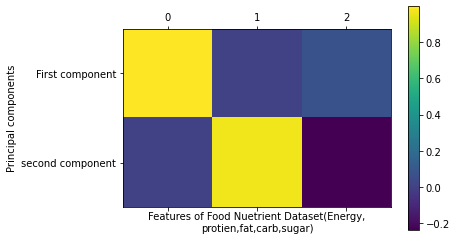

In [ ]:
# Plotting Heat Map of component Y
import matplotlib.pyplot as plt
plt.matshow(pca.components_)
plt.yticks(range(2),["First component","second component"])
plt.colorbar()
plt.xticks(range(3))
plt.xlabel("Features of Food Nuetrient Dataset(Energy,\nprotien,fat,carb,sugar)")
plt.ylabel("Principal components")
plt.show()

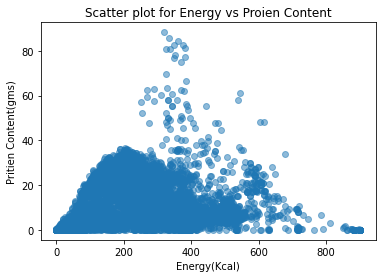

In [ ]:
#Scatter Plot of Energy vs Protien Content
a = dtf_upd.Energy_kcal
b = dtf_upd.Protein_g
plt.scatter(a, b,alpha=0.5)
plt.title('Scatter plot for Energy vs Proien Content')
plt.xlabel('Energy(Kcal)')
plt.ylabel('Pritien Content(gms)')
plt.show()

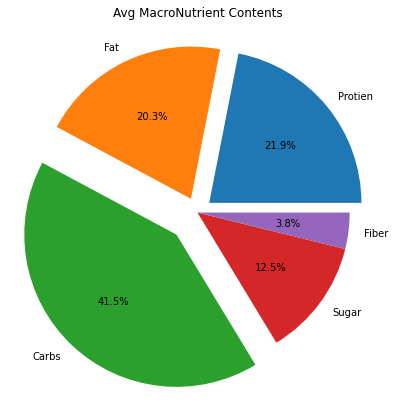

In [ ]:
#Pie Chart of Mean of Macro Nutrients Content in whole data
x = dtf_upd.Protein_g.mean()
y = dtf_upd.Fat_g.mean()
z = dtf_upd.Carb_g.mean()
w = dtf_upd.Sugar_g.mean()
q = dtf_upd.Fiber_g.mean()

arr = [x,y,z,w,q]
nutrient = ['Protien','Fat','Carbs','Sugar','Fiber']
explode = (0.1,0.1,0.2,0,0)
fig = plt.figure(figsize =(10, 7))
plt.pie(arr,explode=explode, labels = nutrient,autopct='%.1f%%')
plt.title("Avg MacroNutrient Contents")
plt.show()

In [ ]:
dtf_new = dtf_upd.iloc[:2000,:7]
dtf_new

,FoodGroup,Energy_kcal,Protein_g,Fat_g,Carb_g,Sugar_g,Fiber_g
0,Dairy and Egg Products,717,0.85,81.11,0.06,0.06,0.0
1,Dairy and Egg Products,717,0.85,81.11,0.06,0.06,0.0
2,Dairy and Egg Products,876,0.28,99.48,0.00,0.00,0.0
3,Dairy and Egg Products,353,21.40,28.74,2.34,0.50,0.0
4,Dairy and Egg Products,371,23.24,29.68,2.79,0.51,0.0
...,...,...,...,...,...,...,...
1995,Breakfast Cereals,387,3.23,1.10,90.32,38.04,2.3
1996,Breakfast Cereals,369,10.39,5.10,74.52,21.14,8.2
1997,Breakfast Cereals,384,8.69,7.59,73.68,28.91,6.4
1998,Breakfast Cereals,368,8.97,4.85,75.70,29.45,6.7


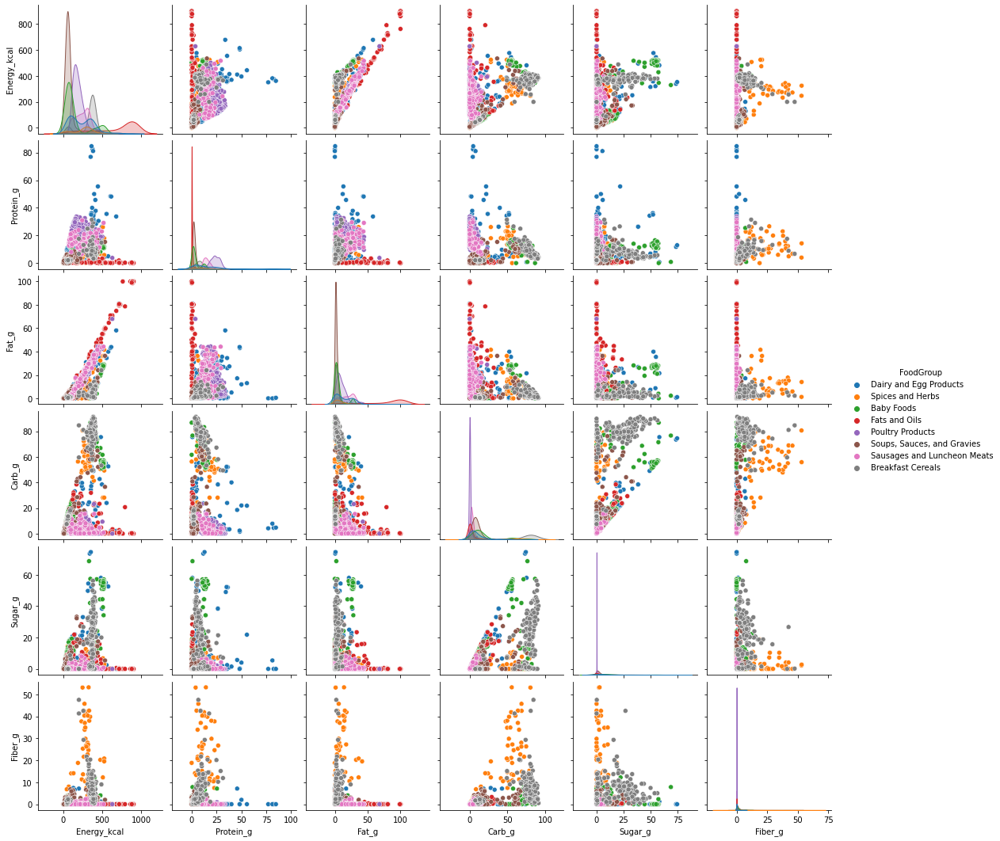

In [ ]:
# pairplot of MacroNutrients
sns.pairplot(dtf_new,hue="FoodGroup")

<AxesSubplot:>

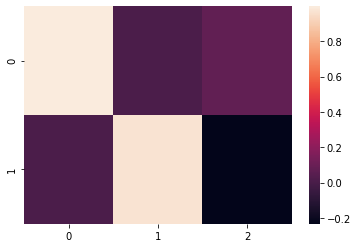

In [ ]:
sns.heatmap(pca.components_)